In [1]:
import pathlib
from pathlib import Path
import pandas as pd

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Thu_Jan_28_19:32:09_PST_2021
Cuda compilation tools, release 11.2, V11.2.142
Build cuda_11.2.r11.2/compiler.29558016_0
torch:  1.13 ; cuda:  1.13.0
detectron2: 0.6


In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
#setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
#from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [4]:
setup_logger()

<Logger detectron2 (DEBUG)>

In [5]:
import matplotlib as mpl
import matplotlib.pyplot as plt 

%matplotlib inline

In [6]:
#original_folder = "valladolid_merida_8clases_25Oct2022"
#tmp_str = "coco_" + purpose

In [7]:
from detectron2.data.datasets import register_coco_instances

f = Path.cwd() / ("coco_" + "train") 
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_train", {}, str(l), str(d))

In [8]:
MetadataCatalog.get("my_dataset_train")

namespace(name='my_dataset_train',
          json_file='/home/jose/darknet/coco_train/labels.json',
          image_root='/home/jose/darknet/coco_train/data',
          evaluator_type='coco')

In [9]:
f = Path.cwd() / ("coco_" + "test")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_test", {}, str(l), str(d))

In [10]:
MetadataCatalog.get("my_dataset_test")

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco')

In [11]:
f = Path.cwd() / ("coco_" + "val")
l = f / "labels.json"
d = f / "data"
register_coco_instances("my_dataset_val", {}, str(l), str(d))

In [12]:
MetadataCatalog.get("my_dataset_val")

namespace(name='my_dataset_val',
          json_file='/home/jose/darknet/coco_val/labels.json',
          image_root='/home/jose/darknet/coco_val/data',
          evaluator_type='coco')

WARNING [11/24 05:08:53 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 05:08:53 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json


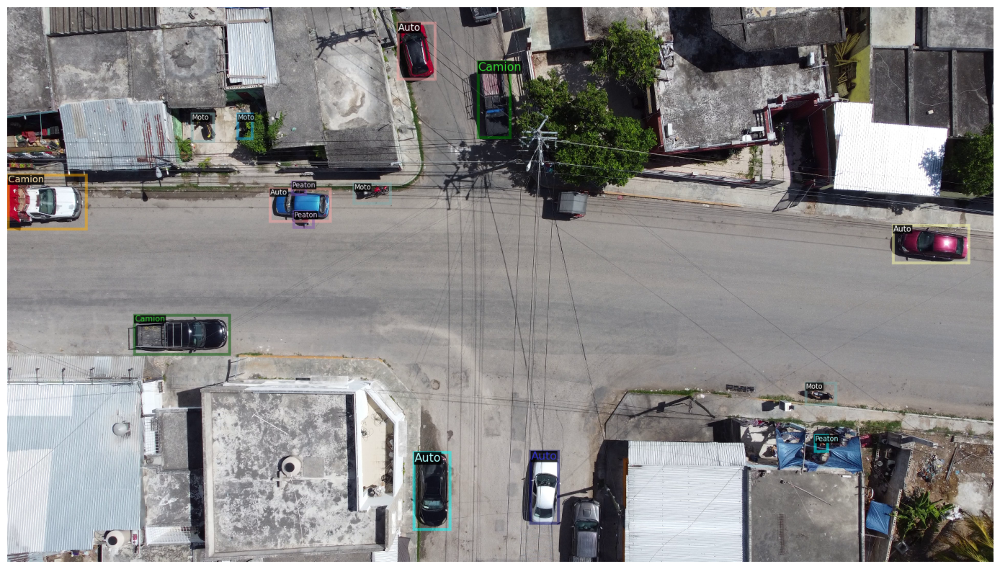

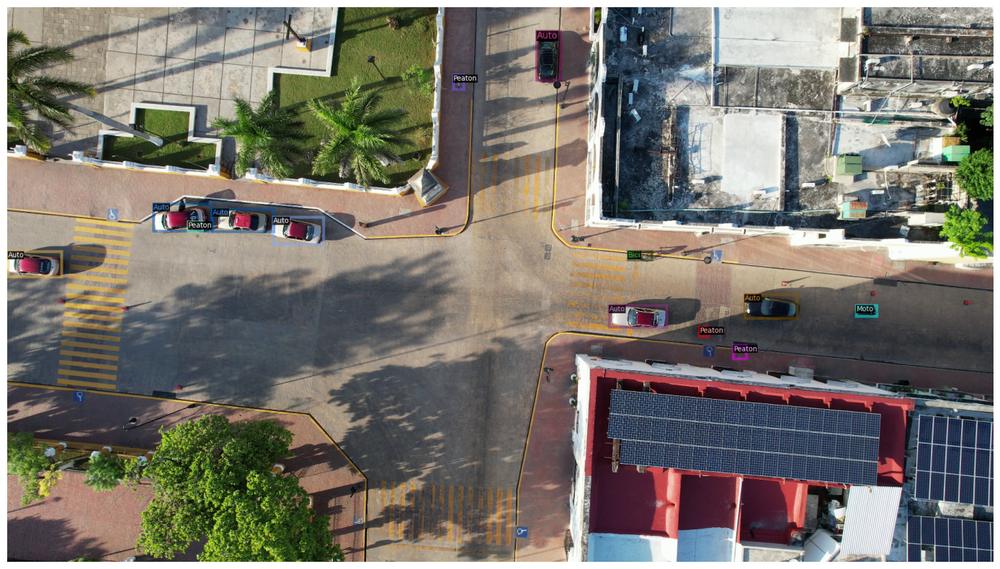

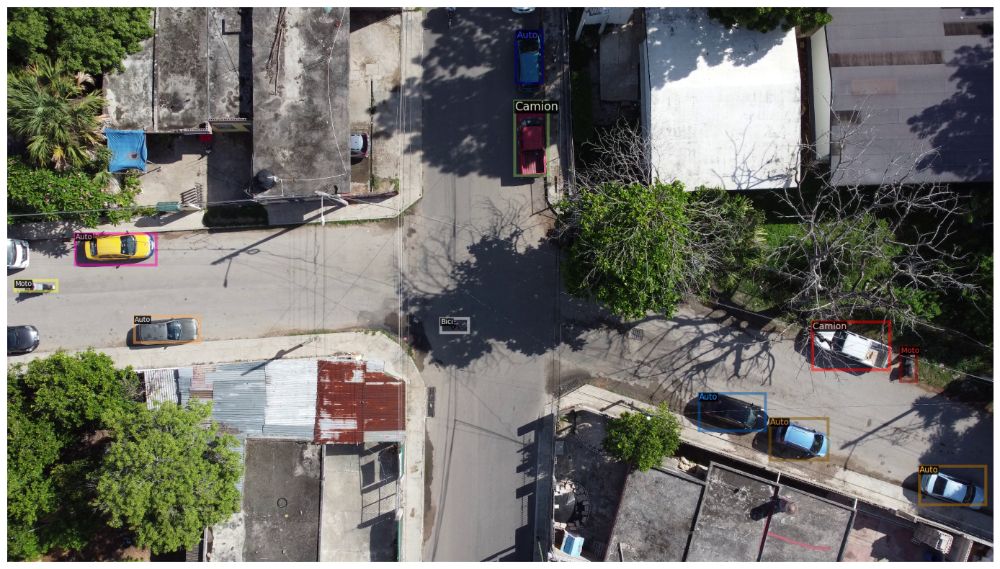

In [13]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")

dataset_dicts = DatasetCatalog.get("my_dataset_train")
#print("hi")
import random
from detectron2.utils.visualizer import Visualizer


for d in random.sample(dataset_dicts, 3):
    
    img = cv2.imread(d["file_name"])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #print(d["file_name"])

    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    #cv2_imshow(vis.get_image()[:, :, ::-1])
    #cv2.imshow("img", vis.get_image()[:, :, ::-1])
    #Image(d["file_name"])
    #Image(vis.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(vis.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()

In [14]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [15]:
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_101_DC5_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_101_DC5_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001
#https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-Detection/faster_rcnn_R_101_FPN_3x.yaml
#https://github.com/facebookresearch/detectron2/blob/main/configs/COCO-Detection/faster_rcnn_R_101_DC5_3x.yaml

cfg.SOLVER.WARMUP_ITERS = 500 # va subiendo lr desde 0
cfg.SOLVER.MAX_ITER = 1800 #1500 #adjust up if val mAP is still rising, adjust down if overfit

cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05


cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 8 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 200

cfg.OUTPUT_DIR = "./output_4"


In [16]:
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[11/24 05:13:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

WARNING [11/24 05:13:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 05:13:52 d2.data.datasets.coco]: Loaded 1935 images in COCO format from /home/jose/darknet/coco_train/labels.json
[11/24 05:13:52 d2.data.build]: Removed 0 images with no usable annotations. 1935 images left.
[11/24 05:13:52 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 10668        |  Autobus   | 278          |    Bici    | 1255         |
|   Camion   | 2192         |   Combi    | 387          |    Moto    | 5304         |
|  MotoTaxi  | 301          |   Peaton   | 8994         |            |              |
|   total    | 29379        |            |              |            |              |
[11/24 05:13:52 d2.data.dataset_mapper]: [Datase

model_final_3e0943.pkl: 739MB [00:21, 34.6MB/s]                                 
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (9, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (9,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (32, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (32,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads

[11/24 05:14:15 d2.engine.train_loop]: Starting training from iteration 0


/home/jose/miniconda3/envs/f1/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1666643004612/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/24 05:14:30 d2.utils.events]:  eta: 0:19:55  iter: 19  total_loss: 2.97  loss_cls: 2.107  loss_box_reg: 0.7292  loss_rpn_cls: 0.09008  loss_rpn_loc: 0.03961  time: 0.6717  data_time: 0.0434  lr: 3.8962e-05  max_mem: 7454M
[11/24 05:14:44 d2.utils.events]:  eta: 0:19:46  iter: 39  total_loss: 2.359  loss_cls: 1.509  loss_box_reg: 0.7365  loss_rpn_cls: 0.07837  loss_rpn_loc: 0.03582  time: 0.6737  data_time: 0.0079  lr: 7.8922e-05  max_mem: 7454M
[11/24 05:14:57 d2.utils.events]:  eta: 0:19:33  iter: 59  total_loss: 1.726  loss_cls: 0.8972  loss_box_reg: 0.7403  loss_rpn_cls: 0.05699  loss_rpn_loc: 0.03837  time: 0.6733  data_time: 0.0072  lr: 0.00011888  max_mem: 7454M
[11/24 05:15:11 d2.utils.events]:  eta: 0:19:22  iter: 79  total_loss: 1.581  loss_cls: 0.7375  loss_box_reg: 0.746  loss_rpn_cls: 0.0386  loss_rpn_loc: 0.03774  time: 0.6735  data_time: 0.0064  lr: 0.00015884  max_mem: 7454M
[11/24 05:15:24 d2.utils.events]:  eta: 0:19:09  iter: 99  total_loss: 1.437  loss_cls: 0.638

[11/24 05:17:35 d2.utils.events]:  eta: 0:17:44  iter: 239  total_loss: 0.8881  loss_cls: 0.3178  loss_box_reg: 0.4963  loss_rpn_cls: 0.0189  loss_rpn_loc: 0.03029  time: 0.6793  data_time: 0.0067  lr: 0.00047852  max_mem: 7454M
[11/24 05:17:50 d2.utils.events]:  eta: 0:17:32  iter: 259  total_loss: 0.8799  loss_cls: 0.3176  loss_box_reg: 0.4943  loss_rpn_cls: 0.01579  loss_rpn_loc: 0.0304  time: 0.6826  data_time: 0.0067  lr: 0.00051848  max_mem: 7454M
[11/24 05:18:04 d2.utils.events]:  eta: 0:17:20  iter: 279  total_loss: 0.8505  loss_cls: 0.3038  loss_box_reg: 0.504  loss_rpn_cls: 0.01601  loss_rpn_loc: 0.02915  time: 0.6869  data_time: 0.0063  lr: 0.00055844  max_mem: 7454M
[11/24 05:18:20 d2.utils.events]:  eta: 0:17:08  iter: 299  total_loss: 0.8169  loss_cls: 0.2429  loss_box_reg: 0.4848  loss_rpn_cls: 0.01377  loss_rpn_loc: 0.0302  time: 0.6924  data_time: 0.0069  lr: 0.0005984  max_mem: 7454M
[11/24 05:18:35 d2.utils.events]:  eta: 0:16:56  iter: 319  total_loss: 0.845  loss_c

[11/24 05:21:51 d2.utils.events]:  eta: 0:15:27  iter: 519  total_loss: 0.6017  loss_cls: 0.1914  loss_box_reg: 0.3802  loss_rpn_cls: 0.01108  loss_rpn_loc: 0.02779  time: 0.7337  data_time: 0.0082  lr: 0.001  max_mem: 7454M
[11/24 05:22:07 d2.utils.events]:  eta: 0:15:24  iter: 539  total_loss: 0.6248  loss_cls: 0.1711  loss_box_reg: 0.4275  loss_rpn_cls: 0.01028  loss_rpn_loc: 0.02781  time: 0.7365  data_time: 0.0086  lr: 0.001  max_mem: 7454M
[11/24 05:22:24 d2.utils.events]:  eta: 0:15:20  iter: 559  total_loss: 0.6159  loss_cls: 0.1832  loss_box_reg: 0.4042  loss_rpn_cls: 0.007159  loss_rpn_loc: 0.02569  time: 0.7391  data_time: 0.0071  lr: 0.001  max_mem: 7454M
[11/24 05:22:40 d2.utils.events]:  eta: 0:15:13  iter: 579  total_loss: 0.621  loss_cls: 0.1834  loss_box_reg: 0.4193  loss_rpn_cls: 0.009123  loss_rpn_loc: 0.02407  time: 0.7420  data_time: 0.0063  lr: 0.001  max_mem: 7454M
WARNING [11/24 05:22:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #catego

WARNING [11/24 05:26:16 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 05:26:16 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_val/labels.json
[11/24 05:26:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/24 05:26:16 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common.NumpySerializedList'>
[11/24 05:26:16 d2.data.common]: Serializing 242 elements to byte tensors and concatenating them all ...
[11/24 05:26:16 d2.data.common]: Serialized dataset takes 0.26 MiB
WARNING [11/24 05:26:16 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[11/24 05:26:16 d2.evaluation.evaluator]: Start inference on 242 batches
[11/24 05:26:18 d2.evaluation.eva

[11/24 05:29:37 d2.evaluation.evaluator]: Start inference on 242 batches
[11/24 05:29:39 d2.evaluation.evaluator]: Inference done 11/242. Dataloading: 0.0312 s/iter. Inference: 0.1082 s/iter. Eval: 0.0004 s/iter. Total: 0.1399 s/iter. ETA=0:00:32
[11/24 05:29:44 d2.evaluation.evaluator]: Inference done 41/242. Dataloading: 0.0594 s/iter. Inference: 0.1052 s/iter. Eval: 0.0005 s/iter. Total: 0.1652 s/iter. ETA=0:00:33
[11/24 05:29:49 d2.evaluation.evaluator]: Inference done 78/242. Dataloading: 0.0475 s/iter. Inference: 0.1044 s/iter. Eval: 0.0004 s/iter. Total: 0.1524 s/iter. ETA=0:00:24
[11/24 05:29:54 d2.evaluation.evaluator]: Inference done 110/242. Dataloading: 0.0494 s/iter. Inference: 0.1047 s/iter. Eval: 0.0004 s/iter. Total: 0.1546 s/iter. ETA=0:00:20
[11/24 05:29:59 d2.evaluation.evaluator]: Inference done 149/242. Dataloading: 0.0445 s/iter. Inference: 0.1037 s/iter. Eval: 0.0004 s/iter. Total: 0.1487 s/iter. ETA=0:00:13
[11/24 05:30:04 d2.evaluation.evaluator]: Inference don

[11/24 05:33:25 d2.evaluation.evaluator]: Inference done 186/242. Dataloading: 0.0392 s/iter. Inference: 0.1046 s/iter. Eval: 0.0004 s/iter. Total: 0.1443 s/iter. ETA=0:00:08
[11/24 05:33:30 d2.evaluation.evaluator]: Inference done 220/242. Dataloading: 0.0403 s/iter. Inference: 0.1045 s/iter. Eval: 0.0004 s/iter. Total: 0.1453 s/iter. ETA=0:00:03
[11/24 05:33:33 d2.evaluation.evaluator]: Total inference time: 0:00:34.252573 (0.144526 s / iter per device, on 1 devices)
[11/24 05:33:33 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:24 (0.104462 s / iter per device, on 1 devices)
[11/24 05:33:33 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/24 05:33:33 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[11/24 05:33:33 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
[11/24 05:33:33 d2.evaluat

Loading and preparing results...
DONE (t=0.02s)
creating index...
index created!
[11/24 05:36:53 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[11/24 05:36:53 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.14 seconds.
[11/24 05:36:53 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[11/24 05:36:53 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.04 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.477
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.746
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.511
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.016
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.172
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.526
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.321
 Avera

[11/24 05:40:14 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP     | category   | AP     | category   | AP     |
|:-----------|:-------|:-----------|:-------|:-----------|:-------|
| Auto       | 70.735 | Autobus    | 77.981 | Bici       | 5.202  |
| Camion     | 69.838 | Combi      | 74.924 | Moto       | 38.453 |
| MotoTaxi   | 30.528 | Peaton     | 10.875 |            |        |
[11/24 05:40:14 d2.engine.defaults]: Evaluation results for my_dataset_val in csv format:
[11/24 05:40:14 d2.evaluation.testing]: copypaste: Task: bbox
[11/24 05:40:14 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[11/24 05:40:14 d2.evaluation.testing]: copypaste: 47.3169,74.2269,50.8718,1.6480,16.9946,52.3058
[11/24 05:40:14 d2.utils.events]:  eta: 0:02:45  iter: 1599  total_loss: 0.5122  loss_cls: 0.1262  loss_box_reg: 0.3529  loss_rpn_cls: 0.007607  loss_rpn_loc: 0.02601  time: 0.7928  data_time: 0.0070  lr: 2.5e-06  max_mem: 7454M
[11/24 05:40:30 d2.utils.events]: 

[11/24 05:43:37 d2.engine.defaults]: Evaluation results for my_dataset_val in csv format:
[11/24 05:43:37 d2.evaluation.testing]: copypaste: Task: bbox
[11/24 05:43:37 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[11/24 05:43:37 d2.evaluation.testing]: copypaste: 47.4721,74.2993,50.9328,1.6028,17.0621,52.4395


In [ ]:
# 21:15:54 - 22:23:58 1:10 hr aprox

In [23]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output_4

In [21]:
%reload_ext tensorboard
%tensorboard --logdir output_4

Reusing TensorBoard on port 6007 (pid 3440515), started 0:15:41 ago. (Use '!kill 3440515' to kill it.)

In [27]:
!kill 3440674

In [17]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output_4/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[11/24 06:14:25 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                        | Shapes                                          |
|:------------------------------------------------|:-------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.res2.0.conv1.*                         | backbone.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.res2.0.conv2.*                         | backbone.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.res2.0.conv3.*                         | backbone.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,w

WARNING [11/24 06:14:25 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/24 06:14:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 06:14:25 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json
[11/24 06:14:25 d2.data.build]: Distribution of instances among all 8 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|    Auto    | 1459         |  Autobus   | 45           |    Bici    | 166          |
|   Camion   | 295          |   Combi    | 45           |    Moto    | 645          |
|  MotoTaxi  | 51           |   Peaton   | 1145         |            |              |
|   total    | 3851         |            |              |    

OrderedDict([('bbox',
              {'AP': 47.528209962557426,
               'AP50': 75.67775900474186,
               'AP75': 50.421167335851415,
               'APs': 0.5026229057590988,
               'APm': 23.83783859411409,
               'APl': 53.423045798155385,
               'AP-Auto': 68.56377562423839,
               'AP-Autobus': 79.7586554097683,
               'AP-Bici': 5.145988947685965,
               'AP-Camion': 70.86453142410053,
               'AP-Combi': 71.76120399373552,
               'AP-Moto': 37.01220496273688,
               'AP-MotoTaxi': 36.68465523665411,
               'AP-Peaton': 10.434664101539685})])

In [18]:
#visualize test data
my_dataset_test_metadata = MetadataCatalog.get("my_dataset_test")
test_dataset_dicts = DatasetCatalog.get("my_dataset_test")

import random
from detectron2.utils.visualizer import Visualizer


WARNING [11/24 06:21:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/24 06:21:00 d2.data.datasets.coco]: Loaded 242 images in COCO format from /home/jose/darknet/coco_test/labels.json


In [19]:
my_dataset_test_metadata

namespace(name='my_dataset_test',
          json_file='/home/jose/darknet/coco_test/labels.json',
          image_root='/home/jose/darknet/coco_test/data',
          evaluator_type='coco',
          thing_classes=['Auto',
                         'Autobus',
                         'Bici',
                         'Camion',
                         'Combi',
                         'Moto',
                         'MotoTaxi',
                         'Peaton'],
          thing_dataset_id_to_contiguous_id={0: 0,
                                             1: 1,
                                             2: 2,
                                             3: 3,
                                             4: 4,
                                             5: 5,
                                             6: 6,
                                             7: 7})

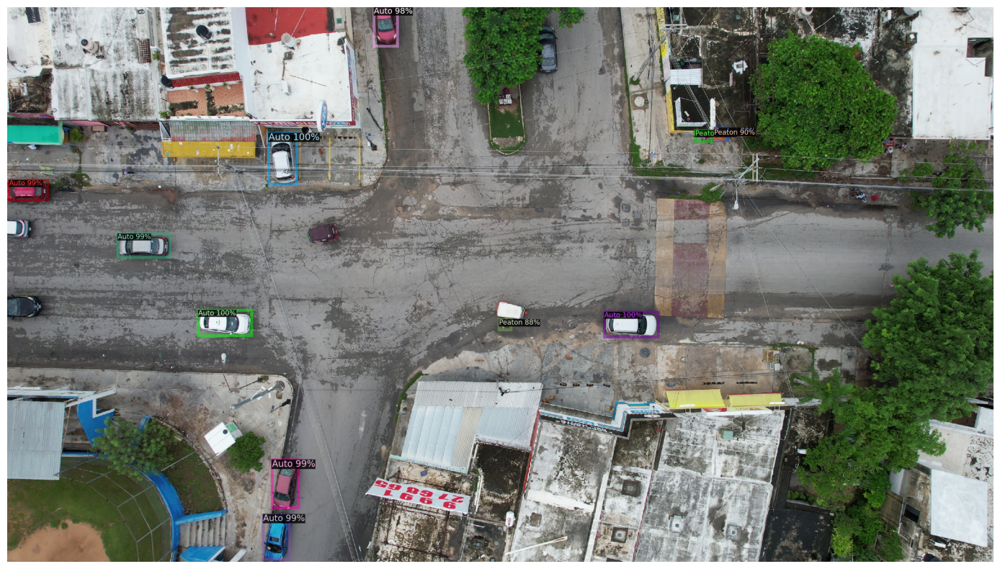

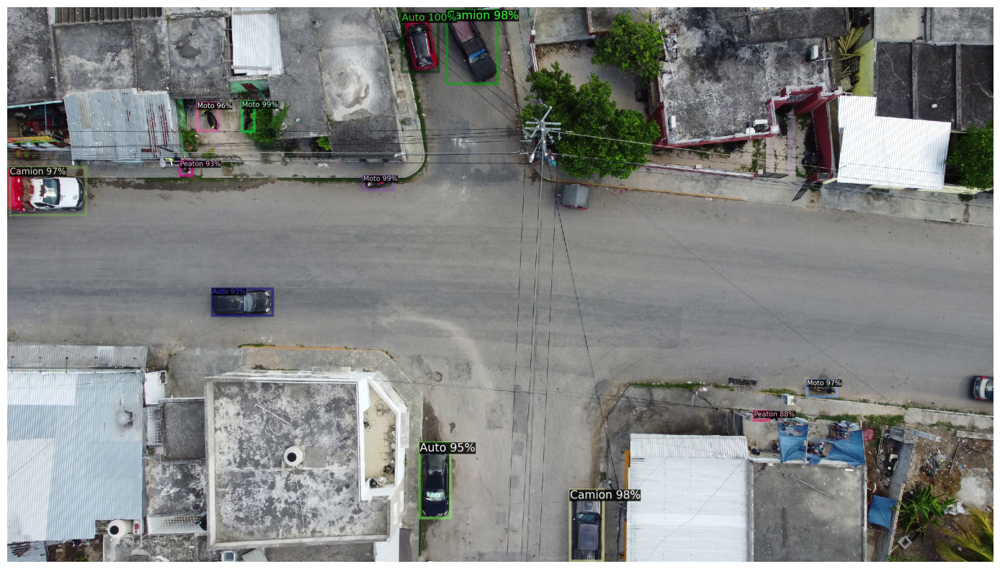

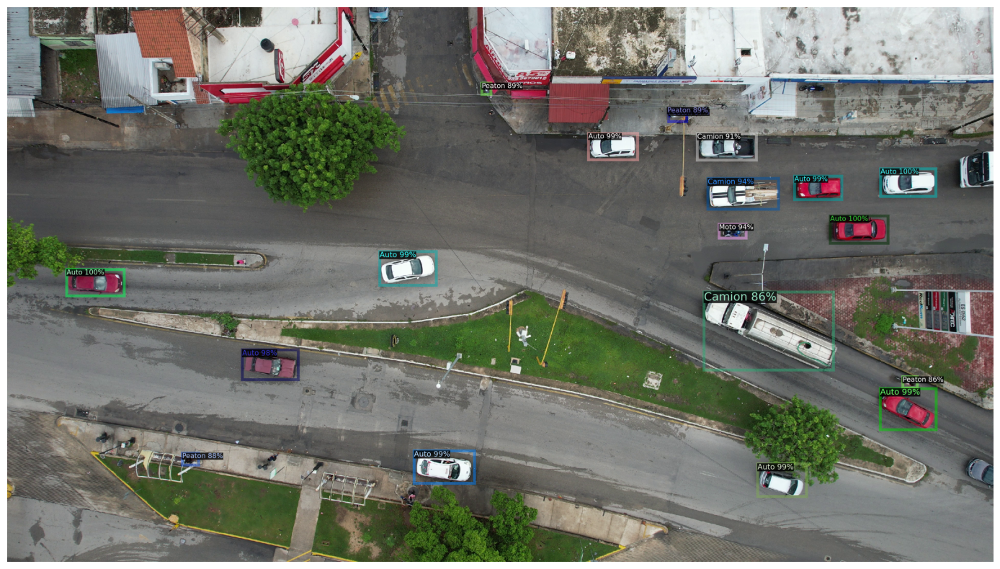

In [20]:
for d in random.sample(test_dataset_dicts, 3):
#for imageName in random.choices(test_imgs, k=3):
    print()
    #im = cv2.imread(imageName)
    im = cv2.imread(d["file_name"])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                metadata=my_dataset_test_metadata, 
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(out.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.margins(x=0)
    plt.show()